In [ ]:
%%shell
set -e

#---------------------------------------------------#
JULIA_VERSION="1.8.2" # any version ≥ 0.7.0
JULIA_PACKAGES="IJulia BenchmarkTools"
JULIA_PACKAGES_IF_GPU="CUDA" # or CuArrays for older Julia versions
JULIA_NUM_THREADS=2
#---------------------------------------------------#

if [ -z `which julia` ]; then
  # Install Julia
  JULIA_VER=`cut -d '.' -f -2 <<< "$JULIA_VERSION"`
  echo "Installing Julia $JULIA_VERSION on the current Colab Runtime..."
  BASE_URL="https://julialang-s3.julialang.org/bin/linux/x64"
  URL="$BASE_URL/$JULIA_VER/julia-$JULIA_VERSION-linux-x86_64.tar.gz"
  wget -nv $URL -O /tmp/julia.tar.gz # -nv means "not verbose"
  tar -x -f /tmp/julia.tar.gz -C /usr/local --strip-components 1
  rm /tmp/julia.tar.gz

  # Install Packages
  nvidia-smi -L &> /dev/null && export GPU=1 || export GPU=0
  if [ $GPU -eq 1 ]; then
    JULIA_PACKAGES="$JULIA_PACKAGES $JULIA_PACKAGES_IF_GPU"
  fi
  for PKG in `echo $JULIA_PACKAGES`; do
    echo "Installing Julia package $PKG..."
    julia -e 'using Pkg; pkg"add '$PKG'; precompile;"' &> /dev/null
  done

  # Install kernel and rename it to "julia"
  echo "Installing IJulia kernel..."
  julia -e 'using IJulia; IJulia.installkernel("julia", env=Dict(
      "JULIA_NUM_THREADS"=>"'"$JULIA_NUM_THREADS"'"))'
  KERNEL_DIR=`julia -e "using IJulia; print(IJulia.kerneldir())"`
  KERNEL_NAME=`ls -d "$KERNEL_DIR"/julia*`
  mv -f $KERNEL_NAME "$KERNEL_DIR"/julia

  echo ''
  echo "Successfully installed `julia -v`!"
  echo "Please reload this page (press Ctrl+R, ⌘+R, or the F5 key) then"
  echo "jump to the 'Checking the Installation' section."
fi

Installing Julia 1.8.2 on the current Colab Runtime...
2023-06-07 20:04:11 URL:https://storage.googleapis.com/julialang2/bin/linux/x64/1.8/julia-1.8.2-linux-x86_64.tar.gz [135859273/135859273] -> "/tmp/julia.tar.gz" [1]
Installing Julia package IJulia...
Installing Julia package BenchmarkTools...
Installing IJulia kernel...
[ Info: Installing julia kernelspec in /root/.local/share/jupyter/kernels/julia-1.8

Please reload this page (press Ctrl+R, ⌘+R, or the F5 key) then
jump to the 'Checking the Installation' section.


In [ ]:
versioninfo()

Julia Version 1.8.2
Commit 36034abf260 (2022-09-29 15:21 UTC)
Platform Info:
  OS: Linux (x86_64-linux-gnu)
  CPU: 2 × Intel(R) Xeon(R) CPU @ 2.20GHz
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-13.0.1 (ORCJIT, broadwell)
  Threads: 2 on 2 virtual cores
Environment:
  LD_LIBRARY_PATH = /usr/local/nvidia/lib:/usr/local/nvidia/lib64
  LD_PRELOAD = /usr/lib/x86_64-linux-gnu/libtcmalloc.so.4
  JULIA_NUM_THREADS = 2




<img src="https://raw.githubusercontent.com/JuliaLang/julia-logo-graphics/master/images/julia-logo-mask.png" height="100" />

In [ ]:
using Pkg

In [ ]:
Pkg.add(url="https://github.com/JuliaQuantumControl/GRAPELinesearchAnalysis.jl.git")

In [ ]:
Pkg.add("QuantumControl")

In [ ]:
using GRAPELinesearchAnalysis

In [ ]:
using QuantumControl

In [ ]:
Pkg.add("QuantumControlBase")

   Resolving package versions...
    Updating `~/.julia/environments/v1.8/Project.toml`
  [f10a33bc] + QuantumControlBase v0.8.3
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`


In [ ]:
ϵ1(t) = 0.2 * QuantumControl.Shapes.flattop(t, T=700, t_rise=0.3, func=:blackman);
ϵ2(t) = 0.2 * QuantumControl.Shapes.flattop(t, T=700, t_rise=0.3, func=:blackman);
ϵ3(t) = 0.2 * QuantumControl.Shapes.flattop(t, T=700, t_rise=0.3, func=:blackman);
ϵ4(t) = 0.2 * QuantumControl.Shapes.flattop(t, T=700, t_rise=0.3, func=:blackman);
ϵ5(t) = 0.2 * QuantumControl.Shapes.flattop(t, T=700, t_rise=0.3, func=:blackman);
ϵ6(t) = 0.2 * QuantumControl.Shapes.flattop(t, T=700, t_rise=0.3, func=:blackman);

In [ ]:

    σ̂_z_z_z = ComplexF64[
        1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
        0  0 -1  0  0  0  0  0
        0  0  0  1  0  0  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0 -1
    ]
    I_σ̂_z_σ̂_z = ComplexF64[
        1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
        0  0 -1  0  0  0  0  0
        0  0  0  1  0  0  0  0
        0  0  0  0  1  0  0  0
        0  0  0  0  0 -1  0  0
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0  1
    ]
    σ̂_z_I_σ̂_z = ComplexF64[
        1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0  1
    ]
     σ̂_z_I_I = ComplexF64[
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0  1  0  0  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0 -1  0  0
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0 -1
    ]
    I_I_σ̂_z = ComplexF64[
        1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0  0  0  1  0  0  0
        0  0  0  0  0 -1  0  0
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0 -1
    ]
    I_σ̂_z_I = ComplexF64[
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
        0  0 -1  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0  0  0  1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0 -1
    ]
    I_I_σ̂_x = ComplexF64[
        0  1  0  0  0  0  0  0
        1  0  0  0  0  0  0  0
        0  0  0  1  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  1  0  0  0
        0  0  0  0  0  0  0  1
        0  0  0  0  0  0  1  0
    ]
    I_σ̂_xI = ComplexF64[
        0  0  1  0  0  0  0  0
        0  0  0  1  0  0  0  0
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0  1
        0  0  0  0  1  0  0  0
        0  0  0  0  0  1  0  0
    ]
    σ̂_xI_I = ComplexF64[
        0  0  0  0  1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0  1
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0  1  0  0  0  0
    ]

    σ̂_z_σ̂_z_I = ComplexF64[
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
        0  0 -1  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0 -1  0  0
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0  1
    ]

    σ̂_zI_σ̂_z = ComplexF64[
        1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0  1
    ]

    I_I_σ̂_y = ComplexF64[
        0  -1im  0  0  0  0  0  0
        1im  0  0  0  0  0  0  0
        0  0  0  -1im  0  0  0  0
        0  0  1im  0  0  0  0  0
        0  0  0  0  0  -1im  0  0
        0  0  0  0  1im  0  0  0
        0  0  0  0  0  0  0  -1im
        0  0  0  0  0  0  1im  0
    ]
    I_σ̂_y_I = ComplexF64[
        0  0  -1im  0  0  0  0  0
        0  0  0  -1im  0  0  0  0
        1im  0  0  0  0  0  0  0
        0  1im  0  0  0  0  0  0
        0  0  0  0  0  0  -1im  0
        0  0  0  0  0  0  0  -1im
        0  0  0  0  1im  0  0  0
        0  0  0  0  0  1im  0  0
    ]

    σ̂_y_I_I= ComplexF64[
        0  0  0  0  -1im  0  0  0
        0  0  0  0  0  -1im  0  0
        0  0  0  0  0  0  -1im  0
        0  0  0  0  0  0  0  -1im
        1im  0  0  0  0  0  0  0
        0  1im  0  0  0  0  0  0
        0  0  1im  0  0  0  0  0
        0  0  0  1im  0  0  0  0
           ]

8×8 Matrix{ComplexF64}:
 0.0+0.0im  0.0+0.0im  0.0+0.0im  …  0.0+0.0im  0.0+0.0im  0.0+0.0im
 0.0+0.0im  0.0+0.0im  0.0+0.0im     0.0-1.0im  0.0+0.0im  0.0+0.0im
 0.0+0.0im  0.0+0.0im  0.0+0.0im     0.0+0.0im  0.0-1.0im  0.0+0.0im
 0.0+0.0im  0.0+0.0im  0.0+0.0im     0.0+0.0im  0.0+0.0im  0.0-1.0im
 0.0+1.0im  0.0+0.0im  0.0+0.0im     0.0+0.0im  0.0+0.0im  0.0+0.0im
 0.0+0.0im  0.0+1.0im  0.0+0.0im  …  0.0+0.0im  0.0+0.0im  0.0+0.0im
 0.0+0.0im  0.0+0.0im  0.0+1.0im     0.0+0.0im  0.0+0.0im  0.0+0.0im
 0.0+0.0im  0.0+0.0im  0.0+0.0im     0.0+0.0im  0.0+0.0im  0.0+0.0im

In [ ]:

# Choose 3 random numbers from the array
J1, J2, J3 = rand(numbers, 3)

# Print the results
println("J1 = $J1")
println("J2 = $J2")
println("J3 = $J3")


J1 = 0.047
J2 = 0.097
J3 = 0.028


In [ ]:

# Choose 3 random numbers from the array
Ω1, Ω2, Ω3 = rand(numbers2, 3)

# Print the results
println("Ω1 = $Ω1")
println("Ω2 = $Ω2")
println("Ω3 = $Ω3")


Ω1 = 1
Ω2 = 3
Ω3 = 2


In [ ]:
"""Two-level-system Hamiltonian."""
function hamiltonian(Ω1=Ω1, ϵ1=ϵ1,ϵ2=ϵ2,ϵ3=ϵ3,ϵ4=ϵ4,ϵ5=ϵ5, Ω2=Ω2, Ω3=Ω3, J1=J1, J2=J2, J3=J3)

    σ̂_z_z_z = ComplexF64[
        1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
        0  0 -1  0  0  0  0  0
        0  0  0  1  0  0  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0 -1
    ]
    I_σ̂_z_σ̂_z = ComplexF64[
        1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
        0  0 -1  0  0  0  0  0
        0  0  0  1  0  0  0  0
        0  0  0  0  1  0  0  0
        0  0  0  0  0 -1  0  0
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0  1
    ]
    σ̂_z_I_σ̂_z = ComplexF64[
        1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0  1
    ]
     σ̂_z_I_I = ComplexF64[
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0  1  0  0  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0 -1  0  0
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0 -1
    ]
    I_I_σ̂_z = ComplexF64[
        1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0  0  0  1  0  0  0
        0  0  0  0  0 -1  0  0
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0 -1
    ]
    I_σ̂_z_I = ComplexF64[
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
        0  0 -1  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0  0  0  1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0 -1
    ]
    I_I_σ̂_x = ComplexF64[
        0  1  0  0  0  0  0  0
        1  0  0  0  0  0  0  0
        0  0  0  1  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  1  0  0  0
        0  0  0  0  0  0  0  1
        0  0  0  0  0  0  1  0
    ]
    I_σ̂_xI = ComplexF64[
        0  0  1  0  0  0  0  0
        0  0  0  1  0  0  0  0
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0  1
        0  0  0  0  1  0  0  0
        0  0  0  0  0  1  0  0
    ]
    σ̂_xI_I = ComplexF64[
        0  0  0  0  1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0  1
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0  1  0  0  0  0
    ]

    σ̂_x_σ̂_x_I = ComplexF64[
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0  1
        0  0  0  0  1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  1  0  0  0  0  0
        0  0  0  1  0  0  0  0
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
    ]
    σ̂_y_σ̂_y_I = ComplexF64[
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0 -1
        0  0  0  0  1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  1  0  0  0  0  0
        0  0  0  1  0  0  0  0
       -1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
    ]
    σ̂_z_σ̂_z_I = ComplexF64[
        1  0  0  0  0  0  0  0
        0  1  0  0  0  0  0  0
        0  0 -1  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0 -1  0  0
        0  0  0  0  0  0  1  0
        0  0  0  0  0  0  0  1
    ]
    σ̂_xI_σ̂_x = ComplexF64[
        0  0  0  0  0  1  0  0
        0  0  0  0  1  0  0  0
        0  0  0  0  0  0  0  1
        0  0  0  0  0  0  1  0
        0  1  0  0  0  0  0  0
        1  0  0  0  0  0  0  0
        0  0  0  1  0  0  0  0
        0  0  1  0  0  0  0  0
    ]
    σ̂_yI_σ̂_y = ComplexF64[
        0  0  0  0  0 -1  0  0
        0  0  0  0  1  0  0  0
        0  0  0  0  0  0  0 -1
        0  0  0  0  0  0  1  0
        0  1  0  0  0  0  0  0
       -1  0  0  0  0  0  0  0
        0  0  0  1  0  0  0  0
        0  0 -1  0  0  0  0  0
    ]
    σ̂_zI_σ̂_z = ComplexF64[
        1  0  0  0  0  0  0  0
        0 -1  0  0  0  0  0  0
        0  0  1  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0  1  0  0
        0  0  0  0  0  0 -1  0
        0  0  0  0  0  0  0  1
    ]

    I_I_σ̂_y = ComplexF64[
        0  -1im  0  0  0  0  0  0
        1im  0  0  0  0  0  0  0
        0  0  0  -1im  0  0  0  0
        0  0  1im  0  0  0  0  0
        0  0  0  0  0  -1im  0  0
        0  0  0  0  1im  0  0  0
        0  0  0  0  0  0  0  -1im
        0  0  0  0  0  0  1im  0
    ]
    I_σ̂_y_I = ComplexF64[
        0  0  -1im  0  0  0  0  0
        0  0  0  -1im  0  0  0  0
        1im  0  0  0  0  0  0  0
        0  1im  0  0  0  0  0  0
        0  0  0  0  0  0  -1im  0
        0  0  0  0  0  0  0  -1im
        0  0  0  0  1im  0  0  0
        0  0  0  0  0  1im  0  0
    ]

    σ̂_z_z_x= ComplexF64[
        0  1  0  0  0  0  0  0
        1  0  0  0  0  0  0  0
        0  0  0 -1  0  0  0  0
        0  0 -1  0  0  0  0  0
        0  0  0  0  0 -1  0  0
        0  0  0  0 -1  0  0  0
        0  0  0  0  0  0  0  1
        0  0  0  0  0  0  1  0
           ]
    σ̂_y_I_I= ComplexF64[
        0  0  0  0  -1im  0  0  0
        0  0  0  0  0  -1im  0  0
        0  0  0  0  0  0  -1im  0
        0  0  0  0  0  0  0  -1im
        1im  0  0  0  0  0  0  0
        0  1im  0  0  0  0  0  0
        0  0  1im  0  0  0  0  0
        0  0  0  1im  0  0  0  0
           ]
    Ĥ₀ = -0.5 * (Ω1 * σ̂_z_I_I + Ω2 *I_σ̂_z_I + Ω3 * I_I_σ̂_z)  + J1 * (I_σ̂_z_σ̂_z) +J2 *(σ̂_z_I_σ̂_z) + J3 * ( σ̂_z_σ̂_z_I)
    Ĥ₁ = I_I_σ̂_x
    Ĥ2 = I_σ̂_xI
    Ĥ3 = σ̂_xI_I
    Ĥ4 = I_I_σ̂_y
    Ĥ5 = I_σ̂_y_I
    Ĥ6 = σ̂_y_I_I
    return (Ĥ₀, (Ĥ₁, ϵ1), (Ĥ2, ϵ2), (Ĥ3, ϵ3), (Ĥ4, ϵ4), (Ĥ5, ϵ5), (Ĥ6, ϵ6))
end;


In [ ]:
H = hamiltonian();
H

(ComplexF64[-2.828 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; 0.0 + 0.0im -1.1159999999999999 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; … ; 0.0 + 0.0im 0.0 + 0.0im … 0.884 + 0.0im 0.0 + 0.0im; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 3.172 + 0.0im], (ComplexF64[0.0 + 0.0im 1.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; 1.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; … ; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 1.0 + 0.0im; 0.0 + 0.0im 0.0 + 0.0im … 1.0 + 0.0im 0.0 + 0.0im], ϵ1), (ComplexF64[0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; … ; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im], ϵ2), (ComplexF64[0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; … ; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im], ϵ3), (ComplexF64[0.0 + 0.0im 0.0 - 1.0im … 0.0 + 0.0im 0.0 + 0.0im; 0.0 + 1.0im 0.0

In [ ]:
tlist = collect(range(0, 700, length=7000));

In [ ]:
Pkg.add("Plots")
using Plots
Plots.default(
    linewidth               = 3,
    size                    = (700, 450),
    legend                  = :right,
    foreground_color_legend = nothing,
    background_color_legend = RGBA(1, 1, 1, 0.8)
)

   Resolving package versions...
    Updating `~/.julia/environments/v1.8/Project.toml`
  [91a5bcdd] + Plots v1.38.15
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`


In [ ]:
function ket(label)
    result = Dict("000" => Vector{ComplexF64}([1, 0, 0, 0, 0, 0, 0, 0]), "001" => Vector{ComplexF64}([0, 1, 0, 0, 0, 0, 0, 0]), "010" => Vector{ComplexF64}([0, 0, 1, 0, 0, 0, 0, 0]), "011" => Vector{ComplexF64}([0, 0, 0, 1, 0, 0, 0, 0])
    , "100" => Vector{ComplexF64}([0, 0, 0, 0, 1, 0, 0, 0]), "101" => Vector{ComplexF64}([0, 0, 0, 0, 0, 1, 0, 0]), "110" => Vector{ComplexF64}([0, 0, 0, 0, 0, 0, 1, 0]), "111" => Vector{ComplexF64}([0, 0, 0, 0, 0, 0, 0, 1]))
    return result[string(label)]
end;

In [ ]:
basis = [ket("000"),ket("001"),ket("010"),ket("011"),ket("100"),ket("101"),ket("110"),ket("111")];

In [ ]:
Toffoli = [
    1  0  0  0  0  0  0  0
    0  1  0  0  0  0  0  0
    0  0  1  0  0  0  0  0
    0  0  0  1  0  0  0  0
    0  0  0  0  1  0  0  0
    0  0  0  0  0  1  0  0
    0  0  0  0  0  0  0  1
    0  0  0  0  0  0  1  0
];


In [ ]:
basis_tgt = transpose(Toffoli) * basis;

In [ ]:
objectives = [Objective(initial_state = psi, target_state = psitgt, generator = H) for
    (psi, psitgt) ∈ zip(basis, basis_tgt)];

objectives

8-element Vector{Objective{Vector{ComplexF64}, Tuple{Matrix{ComplexF64}, Tuple{Matrix{ComplexF64}, typeof(ϵ1)}, Tuple{Matrix{ComplexF64}, typeof(ϵ2)}, Tuple{Matrix{ComplexF64}, typeof(ϵ3)}, Tuple{Matrix{ComplexF64}, typeof(ϵ4)}, Tuple{Matrix{ComplexF64}, typeof(ϵ5)}, Tuple{Matrix{ComplexF64}, typeof(ϵ6)}}}}:
 Objective{Vector{ComplexF64}, Tuple{Matrix{ComplexF64}, Tuple{Matrix{ComplexF64}, typeof(ϵ1)}, Tuple{Matrix{ComplexF64}, typeof(ϵ2)}, Tuple{Matrix{ComplexF64}, typeof(ϵ3)}, Tuple{Matrix{ComplexF64}, typeof(ϵ4)}, Tuple{Matrix{ComplexF64}, typeof(ϵ5)}, Tuple{Matrix{ComplexF64}, typeof(ϵ6)}}}(…)
 Objective{Vector{ComplexF64}, Tuple{Matrix{ComplexF64}, Tuple{Matrix{ComplexF64}, typeof(ϵ1)}, Tuple{Matrix{ComplexF64}, typeof(ϵ2)}, Tuple{Matrix{ComplexF64}, typeof(ϵ3)}, Tuple{Matrix{ComplexF64}, typeof(ϵ4)}, Tuple{Matrix{ComplexF64}, typeof(ϵ5)}, Tuple{Matrix{ComplexF64}, typeof(ϵ6)}}}(…)
 Objective{Vector{ComplexF64}, Tuple{Matrix{ComplexF64}, Tuple{Matrix{ComplexF64}, typeof(ϵ1)}, Tupl

In [ ]:
problem = ControlProblem(
    objectives=objectives,
    tlist=tlist,
    pulse_options=Dict(),
    iter_stop=700,
    J_T=QuantumControl.Functionals.J_T_sm,
    check_convergence=res -> begin
        ((res.J_T < 1e-3) && (res.converged = true) && (res.message = "J_T < 10⁻³"))
    end,
);

In [ ]:
using LinearAlgebra

In [ ]:
Pkg.add("QuantumPropagators")
using QuantumPropagators

   Resolving package versions...
    Updating `~/.julia/environments/v1.8/Project.toml`
  [7bf12567] + QuantumPropagators v0.6.0
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`


In [ ]:
function store_pulses(wrk, iteration, _...)
    L = length(wrk.controls)
    ϵ_opt = reshape(wrk.pulsevals, L, :)
    opt_pulses = [QuantumControl.Controls.discretize_on_midpoints(ϵ_opt[l, :], tlist) for l=1:L]
    return Tuple(opt_pulses)
end

store_pulses (generic function with 1 method)

In [ ]:
Pkg.add("GRAPE")
using GRAPE

   Resolving package versions...
    Updating `~/.julia/environments/v1.8/Project.toml`
  [6b52fcaf] + GRAPE v0.5.4
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`


In [ ]:
wrk=GRAPE.GrapeWrk(problem; )

GrapeWrk{}(Objective{Vector{ComplexF64}, Tuple{Matrix{ComplexF64}, Tuple{Matrix{ComplexF64}, typeof(ϵ1)}, Tuple{Matrix{ComplexF64}, typeof(ϵ2)}, Tuple{Matrix{ComplexF64}, typeof(ϵ3)}, Tuple{Matrix{ComplexF64}, typeof(ϵ4)}, Tuple{Matrix{ComplexF64}, typeof(ϵ5)}, Tuple{Matrix{ComplexF64}, typeof(ϵ6)}}}[Objective{Vector{ComplexF64}, Tuple{Matrix{ComplexF64}, Tuple{Matrix{ComplexF64}, typeof(ϵ1)}, Tuple{Matrix{ComplexF64}, typeof(ϵ2)}, Tuple{Matrix{ComplexF64}, typeof(ϵ3)}, Tuple{Matrix{ComplexF64}, typeof(ϵ4)}, Tuple{Matrix{ComplexF64}, typeof(ϵ5)}, Tuple{Matrix{ComplexF64}, typeof(ϵ6)}}}(…), Objective{Vector{ComplexF64}, Tuple{Matrix{ComplexF64}, Tuple{Matrix{ComplexF64}, typeof(ϵ1)}, Tuple{Matrix{ComplexF64}, typeof(ϵ2)}, Tuple{Matrix{ComplexF64}, typeof(ϵ3)}, Tuple{Matrix{ComplexF64}, typeof(ϵ4)}, Tuple{Matrix{ComplexF64}, typeof(ϵ5)}, Tuple{Matrix{ComplexF64}, typeof(ϵ6)}}}(…), Objective{Vector{ComplexF64}, Tuple{Matrix{ComplexF64}, Tuple{Matrix{ComplexF64}, typeof(ϵ1)}, Tuple{Matrix{

In [ ]:
using QuantumControlBase

In [ ]:
opt_result_LBFGSB = optimize(

    problem,
    method = :grape,
    force = true,
    info_hook = QuantumControlBase.chain_infohooks(

        QuantumControl.GRAPE.print_table,
        store_pulses
    )
);

 iter.        J_T     |∇J_T|       ΔJ_T   FG(F)    secs
     0   9.58e-01   6.91e-01        n/a    1(0)    15.0
     1   9.10e-01   1.12e+00  -4.79e-02    1(0)     7.6
     2   8.84e-01   1.19e+00  -2.62e-02    1(0)     7.2
     3   6.64e-01   2.36e+00  -2.20e-01    1(0)     6.2
     4   6.06e-01   2.56e+00  -5.84e-02    3(0)    20.3
     5   3.34e-01   2.16e+00  -2.72e-01    1(0)     6.1
     6   1.89e-01   1.76e+00  -1.45e-01    2(0)    13.1
     7   1.07e-01   1.61e+00  -8.16e-02    1(0)     6.9
     8   6.46e-02   1.07e+00  -4.27e-02    2(0)    14.3
     9   3.88e-02   8.78e-01  -2.58e-02    1(0)     9.0
    10   2.30e-02   4.30e-01  -1.58e-02    1(0)    12.3
    11   1.81e-02   2.74e-01  -4.88e-03    1(0)     6.2
    12   1.14e-02   2.53e-01  -6.70e-03    1(0)     7.0
    13   5.28e-03   2.11e-01  -6.11e-03    1(0)     6.2
    14   4.93e-03   3.79e-01  -3.51e-04    1(0)     7.0
    15   2.10e-03   7.53e-02  -2.83e-03    1(0)     6.4
    16   1.83e-03   5.80e-02  -2.65e-04    1(0) 

In [ ]:
opt_result_LBFGSB

GRAPE Optimization Result
-------------------------
- Started at 2023-06-07T16:05:54.533
- Number of objectives: 8
- Number of iterations: 19
- Number of pure func evals: 0
- Number of func/grad evals: 24
- Value of functional: 8.06597e-04
- Reason for termination: J_T < 10⁻³
- Ended at 2023-06-07T16:08:52.803 (2 minutes, 58 seconds, 270 milliseconds)


In [ ]:
function plot_pulse1(pulse::Vector, tlist)
    plot(tlist, pulse, xlabel="time (ns)", ylabel="amplitude" , legend=false)

    ylabel!("pulse amplitude")
end

plot_control(ϵ::T, tlist) where {T<:Function} = plot_control([ϵ(t) for t in tlist], tlist);

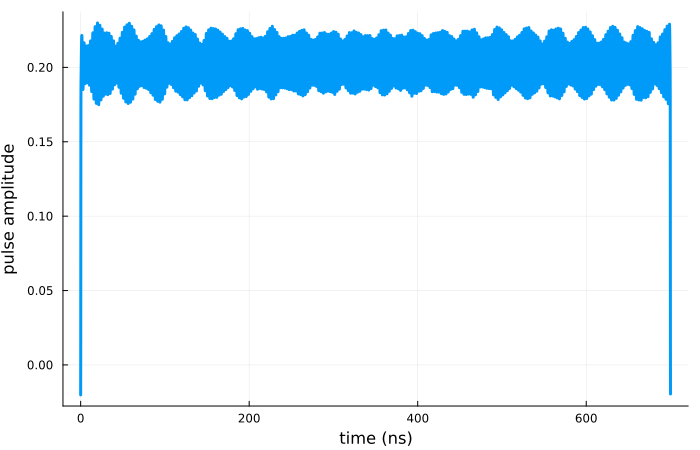

In [ ]:
fig2 = plot_pulse1(opt_result_LBFGSB.optimized_controls[1], tlist)

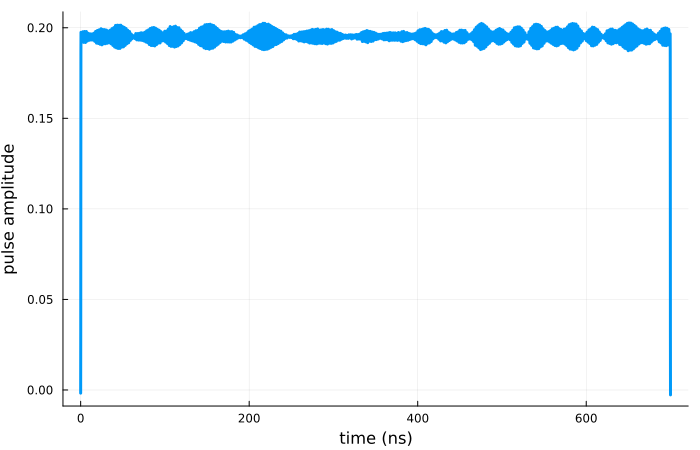

In [ ]:
fig2 = plot_pulse1(opt_result_LBFGSB.optimized_controls[2], tlist)

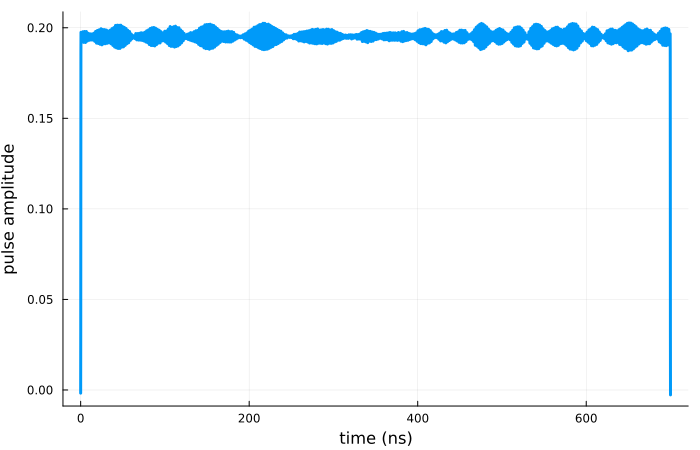

In [ ]:
fig2 = plot_pulse1(opt_result_LBFGSB.optimized_controls[2], tlist)

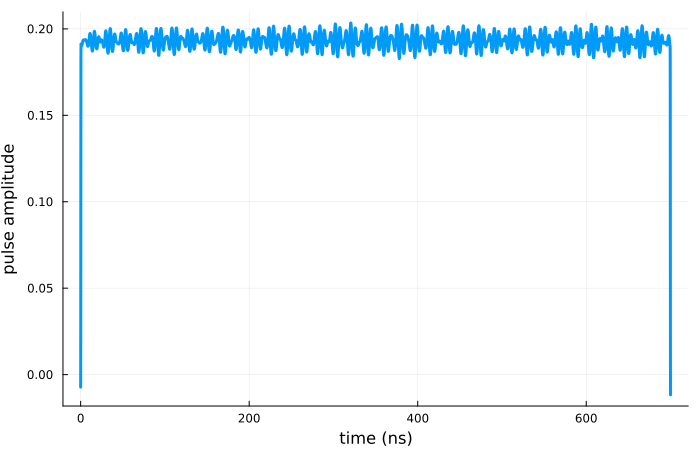

In [ ]:
fig3 = plot_pulse1(opt_result_LBFGSB.optimized_controls[3], tlist)

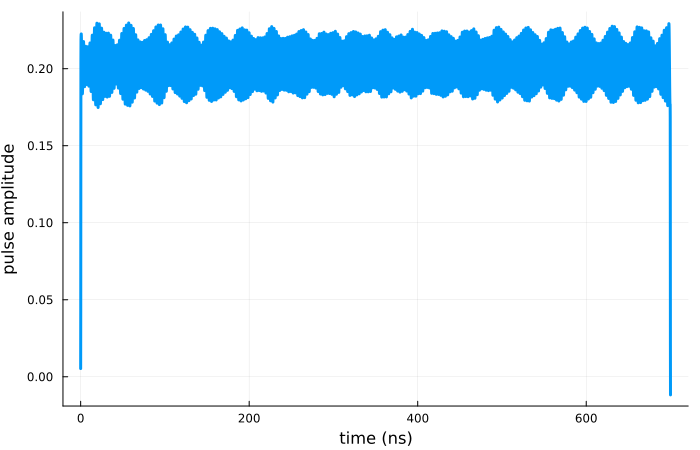

In [ ]:
fig4 = plot_pulse1(opt_result_LBFGSB.optimized_controls[4], tlist)

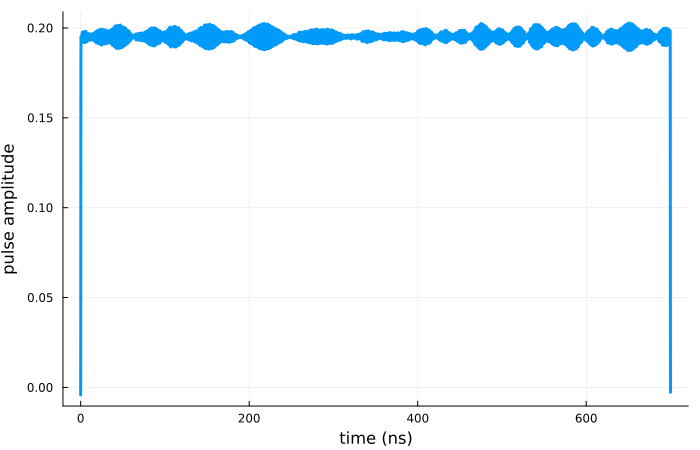

In [ ]:
fig4 = plot_pulse1(opt_result_LBFGSB.optimized_controls[5], tlist)

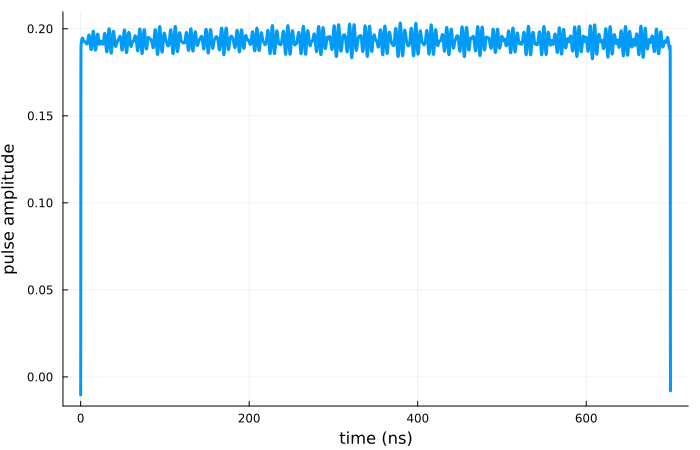

In [ ]:
fig4 = plot_pulse1(opt_result_LBFGSB.optimized_controls[6], tlist)

In [ ]:
all_pulses=opt_result_LBFGSB.records

In [ ]:
ket_000= Vector{ComplexF64}([1, 0, 0, 0, 0, 0, 0, 0])
ket_001= Vector{ComplexF64}([0, 1, 0, 0, 0, 0, 0, 0])
ket_010= Vector{ComplexF64}([0, 0, 1, 0, 0, 0, 0, 0])
ket_011= Vector{ComplexF64}([0, 0, 0, 1, 0, 0, 0, 0])
ket_100= Vector{ComplexF64}([0, 0, 0, 0, 1, 0, 0, 0])
ket_101= Vector{ComplexF64}([0, 0, 0, 0, 0, 1, 0, 0])
ket_110= Vector{ComplexF64}([0, 0, 0, 0, 0, 0, 1, 0])
ket_111= Vector{ComplexF64}([0, 0, 0, 0, 0, 0, 0, 1])

bra_000=reshape(ket_000, (8, 1))
bra_001=reshape(ket_001, (8, 1))
bra_010=reshape(ket_010, (8, 1))
bra_011=reshape(ket_011, (8, 1))
bra_100=reshape(ket_100, (8, 1))
bra_101=reshape(ket_101, (8, 1))
bra_110=reshape(ket_110, (8, 1))
bra_111=reshape(ket_111, (8, 1))

8×1 Matrix{ComplexF64}:
 0.0 + 0.0im
 0.0 + 0.0im
 0.0 + 0.0im
 0.0 + 0.0im
 0.0 + 0.0im
 0.0 + 0.0im
 0.0 + 0.0im
 1.0 + 0.0im

In [ ]:
obs000 = Float64[]
obs001 = Float64[]
obs010 = Float64[]
obs011 = Float64[]
obs100 = Float64[]
obs101 = Float64[]
obs110 = Float64[]
obs111 = Float64[]

psi_tj=ket_000
for i in 1:7000
    opt1 = opt_result_LBFGSB.optimized_controls[1][i]
    opt2 = opt_result_LBFGSB.optimized_controls[2][i]
    opt3 = opt_result_LBFGSB.optimized_controls[3][i]
    opt4 = opt_result_LBFGSB.optimized_controls[4][i]
    opt5 = opt_result_LBFGSB.optimized_controls[5][i]
    opt6 = opt_result_LBFGSB.optimized_controls[6][i]
    H_t = -0.5 * (Ω1 * σ̂_z_I_I + Ω2 *I_σ̂_z_I + Ω3 * I_I_σ̂_z)  + J1 * (I_σ̂_z_σ̂_z) + J2 *(σ̂_z_I_σ̂_z) + J3 * ( σ̂_z_σ̂_z_I) + opt1 * I_I_σ̂_x + opt2 * I_σ̂_xI + opt3 * σ̂_xI_I + opt4 * I_I_σ̂_y + opt5 * I_σ̂_y_I + opt6 * σ̂_y_I_I

    U = exp(-1im * H_t * dt)
    psi_tj= U * psi_tj

    psi_t000= dot(bra_000 ,psi_tj)
    psi_t001= dot(bra_001 ,psi_tj)
    psi_t010= dot(bra_010 ,psi_tj)
    psi_t011= dot(bra_011 ,psi_tj)
    psi_t100= dot(bra_100 ,psi_tj)
    psi_t101= dot(bra_101 ,psi_tj)
    psi_t110= dot(bra_110 ,psi_tj)
    psi_t111= dot(bra_111 ,psi_tj)
    psi2_t000j= abs.(psi_t000[1]).^2
    psi2_t001j= abs.(psi_t001[1]).^2
    psi2_t010j= abs.(psi_t010[1]).^2
    psi2_t011j= abs.(psi_t011[1]).^2
    psi2_t100j= abs.(psi_t100[1]).^2
    psi2_t101j= abs.(psi_t101[1]).^2
    psi2_t110j= abs.(psi_t110[1]).^2
    psi2_t111j= abs.(psi_t111[1]).^2

    append!(obs000,psi2_t000j)
    append!(obs001,psi2_t001j)
    append!(obs010,psi2_t010j)
    append!(obs011,psi2_t011j)
    append!(obs100,psi2_t100j)
    append!(obs101,psi2_t101j)
    append!(obs110,psi2_t110j)
    append!(obs111,psi2_t111j)
end

println(obs000)
println(obs001)
println(obs010)
println(obs011)
println(obs100)
println(obs101)
println(obs110)
println(obs111)

[0.9999938868838292, 0.9999538692628347, 0.9987675797970873, 0.9936082091529566, 0.9839441637190371, 0.9703524749218716, 0.9534120944764578, 0.9338253389920103, 0.9123600030257166, 0.8897909806243757, 0.8668478967692479, 0.8441736661642916, 0.8222967353724826, 0.8016175035644981, 0.7824074965370904, 0.7648185901360569, 0.7488990544212447, 0.7346133424721358, 0.7218631633026629, 0.710508182277818, 0.700385429845459, 0.6913269957669683, 0.6831757754894209, 0.6757989559924237, 0.6690986932517166, 0.6630191891557184, 0.6575492627259466, 0.6527196314851306, 0.6485945191110793, 0.6452578648939601, 0.6427952444982415, 0.6412734809569854, 0.6407206541037477, 0.6411096217200659, 0.6423480913326386, 0.6442776438586665, 0.646682934450107, 0.6493107366465031, 0.6518968266039441, 0.6541972679670696, 0.6560197871950041, 0.6572508515741031, 0.6578748238395153, 0.6579830013956843, 0.6577721062794732, 0.6575334355720279, 0.657635007366503, 0.6584993973354003, 0.6605795419364029, 0.6643338144135118, 0.6

Excessive output truncated after 524291 bytes.

 0.04246292219653335, 0.047749201612312456, 0.052210126923603356, 0.055668483019646206, 0.05805662634379106, 0.05939429077851031, 0.05973798554719732, 0.059121708182673725, 0.057515063259030996, 0.05482123979730362, 0.05092390265559543, 0.045773066676089456, 0.03948225985462494, 0.03239978250061946, 0.025120200063594594, 0.01841850476075375, 0.013113948113474622, 0.009895265496315813, 0.009155145817826626, 0.010883164979287464, 0.01465174295733497, 0.01970328369740471, 0.025116941514582568, 0.03001008763632704, 0.033720064965850956, 0.035919063678438695, 0.03663619688286741, 0.036188881691915295, 0.03505130958547563, 0.033703223038665624, 0.03250329734417974, 0.031618980051981035, 0.031023815706827027, 0.030551532120461043, 0.02998057126159381, 0.029117675631076843, 0.027854973142980657, 0.026188351838333273, 0.024200137034336853, 0.022020502248084568, 0.019786047298417764, 0.017610202708753745, 0.01557133090139757, 0.013715107528721883, 0.012062231230581649, 0.010612891466240169, 0.00

In [ ]:
function plot_population1(pop000::Vector, pop001::Vector, pop010::Vector,pop011::Vector,pop100::Vector,pop101::Vector,pop110::Vector,pop111::Vector,tlist)
    fig = plot(tlist, pop000, label="000", xlabel="time (ns)", ylabel="population")
    plot!(fig, tlist, pop001; label="001")
    plot!(fig, tlist, pop010; label="010")
    plot!(fig, tlist, pop011; label="011")
    plot!(fig, tlist, pop100; label="100")
    plot!(fig, tlist, pop101; label="101")
    plot!(fig, tlist, pop110; label="110")
    plot!(fig, tlist, pop111; label="111")
end;

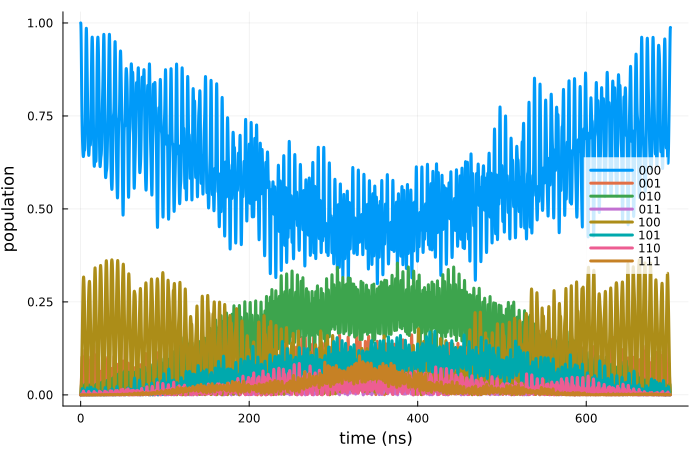

In [ ]:
plot_population1(obs000, obs001, obs010, obs011, obs100, obs101, obs110, obs111,tlist)

In [ ]:
obs000 = Float64[]
obs001 = Float64[]
obs010 = Float64[]
obs011 = Float64[]
obs100 = Float64[]
obs101 = Float64[]
obs110 = Float64[]
obs111 = Float64[]

psi_tj=ket_001
for i in 1:7000
    opt1 = opt_result_LBFGSB.optimized_controls[1][i]
    opt2 = opt_result_LBFGSB.optimized_controls[2][i]
    opt3 = opt_result_LBFGSB.optimized_controls[3][i]
    opt4 = opt_result_LBFGSB.optimized_controls[4][i]
    opt5 = opt_result_LBFGSB.optimized_controls[5][i]
    opt6 = opt_result_LBFGSB.optimized_controls[6][i]
    H_t = -0.5 * (Ω1 * σ̂_z_I_I + Ω2 *I_σ̂_z_I + Ω3 * I_I_σ̂_z)  + J1 * (I_σ̂_z_σ̂_z) + J2 *(σ̂_z_I_σ̂_z) + J3 * ( σ̂_z_σ̂_z_I) + opt1 * I_I_σ̂_x + opt2 * I_σ̂_xI + opt3 * σ̂_xI_I + opt4 * I_I_σ̂_y + opt5 * I_σ̂_y_I + opt6 * σ̂_y_I_I
    U = exp(-1im * H_t * dt)
    psi_tj= U * psi_tj

    psi_t000= dot(bra_000 ,psi_tj)
    psi_t001= dot(bra_001 ,psi_tj)
    psi_t010= dot(bra_010 ,psi_tj)
    psi_t011= dot(bra_011 ,psi_tj)
    psi_t100= dot(bra_100 ,psi_tj)
    psi_t101= dot(bra_101 ,psi_tj)
    psi_t110= dot(bra_110 ,psi_tj)
    psi_t111= dot(bra_111 ,psi_tj)
    psi2_t000j= abs.(psi_t000[1]).^2
    psi2_t001j= abs.(psi_t001[1]).^2
    psi2_t010j= abs.(psi_t010[1]).^2
    psi2_t011j= abs.(psi_t011[1]).^2
    psi2_t100j= abs.(psi_t100[1]).^2
    psi2_t101j= abs.(psi_t101[1]).^2
    psi2_t110j= abs.(psi_t110[1]).^2
    psi2_t111j= abs.(psi_t111[1]).^2

    append!(obs000,psi2_t000j)
    append!(obs001,psi2_t001j)
    append!(obs010,psi2_t010j)
    append!(obs011,psi2_t011j)
    append!(obs100,psi2_t100j)
    append!(obs101,psi2_t101j)
    append!(obs110,psi2_t110j)
    append!(obs111,psi2_t111j)
end

println(obs000)
println(obs001)
println(obs010)
println(obs011)
println(obs100)
println(obs101)
println(obs110)
println(obs111)

[4.325068736565322e-6, 2.532335929701502e-5, 0.00046393412547106517, 0.0023368087375487865, 0.005870861349985198, 0.01091112758802474, 0.017296214194240284, 0.02480901105744006, 0.033192450329409116, 0.04216502538894386, 0.051433822038078045, 0.06070391487329631, 0.06968427363255074, 0.07809143171586373, 0.0856527855482459, 0.09211136820283934, 0.09723331403032778, 0.10081821092724244, 0.10271142823336332, 0.10281662058265045, 0.1011061714940844, 0.09762745383872615, 0.09250340468789502, 0.08592688170488189, 0.07814936362272665, 0.06946554312854518, 0.060196035613474155, 0.050670657021703654, 0.04121445813021211, 0.03213798197927177, 0.02373216538441268, 0.016267139107178464, 0.009993146589365572, 0.005141154451886232, 0.0019206724863198603, 0.0005129263844684636, 0.0010587624700988932, 0.003642266341187561, 0.008272664813972635, 0.014868218988547807, 0.023246138859796452, 0.03312187576209042, 0.04411956010617522, 0.05579319593061034, 0.0676560320177238, 0.0792138702900394, 0.089997385

Excessive output truncated after 524290 bytes.

, 0.07909108487968532, 0.07229748285848603, 0.07023587188593444, 0.07336267075409342, 0.08166131020105337, 0.0946279258855418, 0.11130132137687693, 0.13033726891807573, 0.15012310642975868, 0.1689240310999144, 0.18504806980155192, 0.19701322255663611, 0.20369854208166688, 0.20446153026801198, 0.1992073964032524, 0.18840113501634384, 0.17302029518616163, 0.15445367961940143, 0.1343578955578646, 0.11448867684360876, 0.09652651059391312, 0.08191604755826634, 0.07173620102633207, 0.06661327360207592, 0.06668368625977993, 0.07160682074885016, 0.08062297205989824, 0.09264709954133596, 0.10638634706634591, 0.12046826794881181, 0.13356718604962745, 0.14451783086468703, 0.15240789984019446, 0.15664410878078083, 0.15698919857755053, 0.15356992966170382, 0.14685804583549592, 0.1376273745555304, 0.1268906671815892, 0.11581968825153216, 0.1056518416417261, 0.09758677239511272, 0.09267733687336696, 0.09172125891042278, 0.09516243323283993, 0.10301347952713472, 0.1148127203674457, 0.1296281138883234,

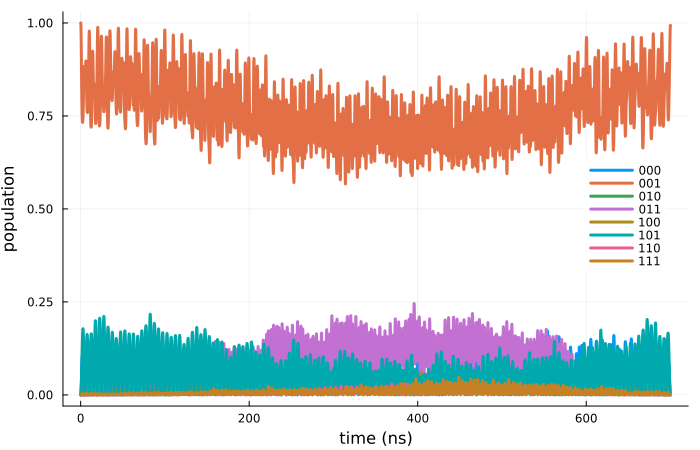

In [ ]:
plot_population1(obs000, obs001, obs010, obs011, obs100, obs101, obs110, obs111,tlist)

In [ ]:
obs000 = Float64[]
obs001 = Float64[]
obs010 = Float64[]
obs011 = Float64[]
obs100 = Float64[]
obs101 = Float64[]
obs110 = Float64[]
obs111 = Float64[]

psi_tj=ket_010
for i in 1:7000
    opt1 = opt_result_LBFGSB.optimized_controls[1][i]
    opt2 = opt_result_LBFGSB.optimized_controls[2][i]
    opt3 = opt_result_LBFGSB.optimized_controls[3][i]
    opt4 = opt_result_LBFGSB.optimized_controls[4][i]
    opt5 = opt_result_LBFGSB.optimized_controls[5][i]
    opt6 = opt_result_LBFGSB.optimized_controls[6][i]
    H_t = -0.5 * (Ω1 * σ̂_z_I_I + Ω2 *I_σ̂_z_I + Ω3 * I_I_σ̂_z)  + J1 * (I_σ̂_z_σ̂_z) + J2 *(σ̂_z_I_σ̂_z) + J3 * ( σ̂_z_σ̂_z_I) + opt1 * I_I_σ̂_x + opt2 * I_σ̂_xI + opt3 * σ̂_xI_I + opt4 * I_I_σ̂_y + opt5 * I_σ̂_y_I + opt6 * σ̂_y_I_I
    U = exp(-1im * H_t * dt)
    psi_tj= U * psi_tj

    psi_t000= dot(bra_000 ,psi_tj)
    psi_t001= dot(bra_001 ,psi_tj)
    psi_t010= dot(bra_010 ,psi_tj)
    psi_t011= dot(bra_011 ,psi_tj)
    psi_t100= dot(bra_100 ,psi_tj)
    psi_t101= dot(bra_101 ,psi_tj)
    psi_t110= dot(bra_110 ,psi_tj)
    psi_t111= dot(bra_111 ,psi_tj)
    psi2_t000j= abs.(psi_t000[1]).^2
    psi2_t001j= abs.(psi_t001[1]).^2
    psi2_t010j= abs.(psi_t010[1]).^2
    psi2_t011j= abs.(psi_t011[1]).^2
    psi2_t100j= abs.(psi_t100[1]).^2
    psi2_t101j= abs.(psi_t101[1]).^2
    psi2_t110j= abs.(psi_t110[1]).^2
    psi2_t111j= abs.(psi_t111[1]).^2

    append!(obs000,psi2_t000j)
    append!(obs001,psi2_t001j)
    append!(obs010,psi2_t010j)
    append!(obs011,psi2_t011j)
    append!(obs100,psi2_t100j)
    append!(obs101,psi2_t101j)
    append!(obs110,psi2_t110j)
    append!(obs111,psi2_t111j)
end

println(obs000)
println(obs001)
println(obs010)
println(obs011)
println(obs100)
println(obs101)
println(obs110)
println(obs111)

[1.9867227255904556e-7, 1.540239194717469e-5, 0.00042753808151090294, 0.002124109008564132, 0.005152929467963236, 0.009147343549583067, 0.01370289736873767, 0.018367650760646434, 0.02269235303017887, 0.0262776400554268, 0.028812366842137043, 0.030099012574032216, 0.030064418071990152, 0.028756439261404622, 0.026328977435258343, 0.023018982458053946, 0.019119327024330866, 0.014951025263174043, 0.010837367123007884, 0.007081470649789474, 0.00394780153889756, 0.0016475674302988987, 0.00032763761478304585, 6.272647852899033e-5, 0.0008508867510622931, 0.002612721987741102, 0.005194985354662034, 0.008379259502911712, 0.011896144823755797, 0.015444824220582286, 0.01871709425120403, 0.02142408799905423, 0.02332313975725172, 0.024241745194998124, 0.024095518643119044, 0.02289753914474595, 0.02075749951597874, 0.017870490288224163, 0.014496807759617586, 0.010935547351979307, 0.00749561442260413, 0.004467939284520034, 0.002102079818759272, 0.0005891937958151494, 5.189261286989227e-5, 0.0005401566

Excessive output truncated after 524306 bytes.

0.141310182750261, 0.12648949324632977, 0.11397503816472558, 0.10508092958989405, 0.10038755427588988, 0.09970712366511027, 0.10222099484988272, 0.1067408722747436, 0.11201535689651672, 0.11699750820582423, 0.12100872831518081, 0.1237717323318229, 0.12532756060006717, 0.12588459975192562, 0.12566143065375657, 0.12477722733066006, 0.12321838793656177, 0.12087860925922078, 0.11764358206543936, 0.11347961737529261, 0.1084903962305944, 0.10292364661949932, 0.09713141566007767, 0.09150453435961892, 0.08640769686034937, 0.08213537525457117, 0.07889482897650663, 0.07680801490406078, 0.07591624592270627, 0.0761736573431869, 0.07742673740229296, 0.07939182797187211, 0.08165307748176362, 0.0837035641241889, 0.08504006592406961, 0.08530053125553738, 0.08441056460061681, 0.08269079664889804, 0.08087840883531866, 0.08003550678930037, 0.08134981619482475, 0.08586892745874022, 0.0942354442260688, 0.10649671811057626, 0.12204563714606902, 0.1397126471339339, 0.15798524158504604, 0.1752940201399151, 0.

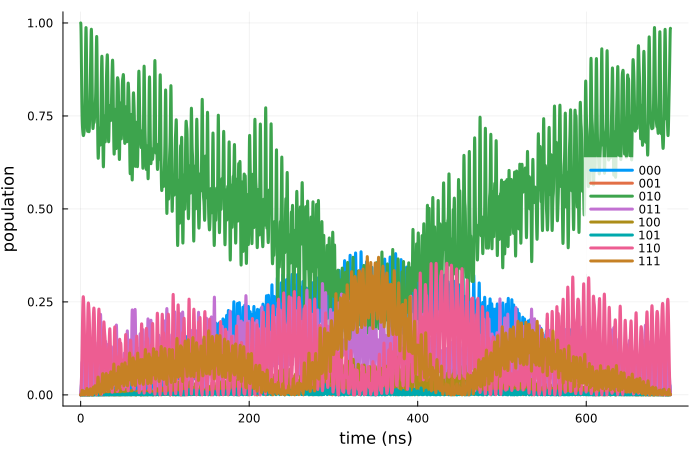

In [ ]:
plot_population1(obs000, obs001, obs010, obs011, obs100, obs101, obs110, obs111,tlist)

In [ ]:
obs000 = Float64[]
obs001 = Float64[]
obs010 = Float64[]
obs011 = Float64[]
obs100 = Float64[]
obs101 = Float64[]
obs110 = Float64[]
obs111 = Float64[]

psi_tj=ket_011
for i in 1:7000
    opt1 = opt_result_LBFGSB.optimized_controls[1][i]
    opt2 = opt_result_LBFGSB.optimized_controls[2][i]
    opt3 = opt_result_LBFGSB.optimized_controls[3][i]
    opt4 = opt_result_LBFGSB.optimized_controls[4][i]
    opt5 = opt_result_LBFGSB.optimized_controls[5][i]
    opt6 = opt_result_LBFGSB.optimized_controls[6][i]
    H_t = -0.5 * (Ω1 * σ̂_z_I_I + Ω2 *I_σ̂_z_I + Ω3 * I_I_σ̂_z)  + J1 * (I_σ̂_z_σ̂_z) + J2 *(σ̂_z_I_σ̂_z) + J3 * ( σ̂_z_σ̂_z_I) + opt1 * I_I_σ̂_x + opt2 * I_σ̂_xI + opt3 * σ̂_xI_I + opt4 * I_I_σ̂_y + opt5 * I_σ̂_y_I + opt6 * σ̂_y_I_I
    U = exp(-1im * H_t * dt)
    psi_tj= U * psi_tj

    psi_t000= dot(bra_000 ,psi_tj)
    psi_t001= dot(bra_001 ,psi_tj)
    psi_t010= dot(bra_010 ,psi_tj)
    psi_t011= dot(bra_011 ,psi_tj)
    psi_t100= dot(bra_100 ,psi_tj)
    psi_t101= dot(bra_101 ,psi_tj)
    psi_t110= dot(bra_110 ,psi_tj)
    psi_t111= dot(bra_111 ,psi_tj)
    psi2_t000j= abs.(psi_t000[1]).^2
    psi2_t001j= abs.(psi_t001[1]).^2
    psi2_t010j= abs.(psi_t010[1]).^2
    psi2_t011j= abs.(psi_t011[1]).^2
    psi2_t100j= abs.(psi_t100[1]).^2
    psi2_t101j= abs.(psi_t101[1]).^2
    psi2_t110j= abs.(psi_t110[1]).^2
    psi2_t111j= abs.(psi_t111[1]).^2

    append!(obs000,psi2_t000j)
    append!(obs001,psi2_t001j)
    append!(obs010,psi2_t010j)
    append!(obs011,psi2_t011j)
    append!(obs100,psi2_t100j)
    append!(obs101,psi2_t101j)
    append!(obs110,psi2_t110j)
    append!(obs111,psi2_t111j)
end

println(obs000)
println(obs001)
println(obs010)
println(obs011)
println(obs100)
println(obs101)
println(obs110)
println(obs111)

[8.586450374384917e-13, 3.9441986945851357e-10, 1.9945288341471853e-7, 4.992622686700861e-6, 3.058639662600327e-5, 0.00010175613896318631, 0.00024421247260414923, 0.00047522661431614844, 0.0007954870240888815, 0.0011845822301671447, 0.0016016829583846216, 0.001991657084381885, 0.002295408318716742, 0.0024620805041274865, 0.0024602262002400973, 0.0022852410848696963, 0.001961248953523398, 0.0015369418088666258, 0.0010762902640696925, 0.0006461933253794471, 0.0003037730689896467, 8.602176466641552e-5, 3.914809839633039e-6, 4.2078047839020545e-5, 0.0001638838660234567, 0.0003207059298222164, 0.0004632146114577978, 0.0005522041333980033, 0.0005665805422388439, 0.0005067828639190764, 0.0003929391210462538, 0.0002582728172626079, 0.0001394172921129235, 6.609727673320653e-5, 5.287870435969246e-5, 9.525872407892422e-5, 0.0001713155863217722, 0.0002486832539243269, 0.00029511779364264896, 0.0002897961851760228, 0.0002320856130226919, 0.00014501780714249655, 7.202301397967192e-5, 6.7295095712189

Excessive output truncated after 524293 bytes.

, 0.6121151088153554, 0.6149564106059998, 0.6140279155970364, 0.6091390981858664, 0.6002387052600814, 0.5874654125121362, 0.5712197872382636, 0.5522371470097482, 0.5316339000804471, 0.5109000248495447, 0.49181840303373425, 0.47630659950943766, 0.466195245202174, 0.46297497710399294, 0.4675562363497066, 0.4800894412544236, 0.49988552279220916, 0.5254595553777915, 0.5546967782364616, 0.5851159451266956, 0.614185344833875, 0.63963664018039, 0.6597232526431067, 0.6733828524179741, 0.6802843402998667, 0.6807634289153456, 0.6756719848922135, 0.6661800990203388, 0.653573899558777, 0.6390864373924063, 0.6237858641268985, 0.6085284044115541, 0.5939675289581161, 0.5805988988621188, 0.568815352374546, 0.5589480134307478, 0.5512774426286221, 0.5460102946884268, 0.5432291925294235, 0.5428334648871983, 0.5444936033344968, 0.5476414225280861, 0.5515109436875408, 0.5552333375924879, 0.5579753944551735, 0.5590981566822016, 0.5583037913066521, 0.5557369755562781, 0.5520130784134736, 0.5481584756550971, 

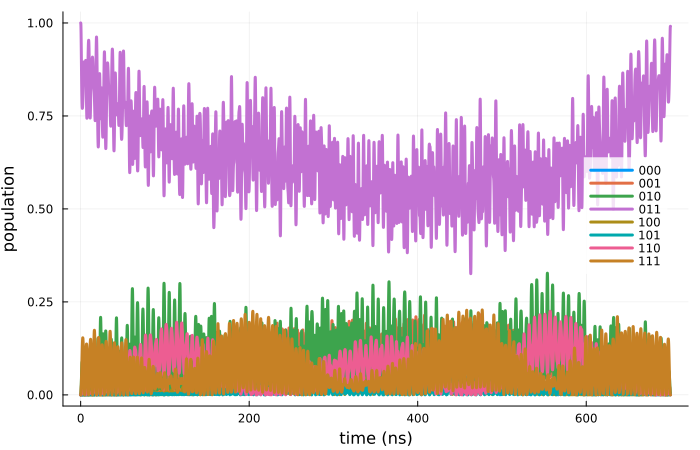

In [ ]:
plot_population1(obs000, obs001, obs010, obs011, obs100, obs101, obs110, obs111,tlist)

In [ ]:
obs000 = Float64[]
obs001 = Float64[]
obs010 = Float64[]
obs011 = Float64[]
obs100 = Float64[]
obs101 = Float64[]
obs110 = Float64[]
obs111 = Float64[]

psi_tj=ket_100
for i in 1:7000
    opt1 = opt_result_LBFGSB.optimized_controls[1][i]
    opt2 = opt_result_LBFGSB.optimized_controls[2][i]
    opt3 = opt_result_LBFGSB.optimized_controls[3][i]
    opt4 = opt_result_LBFGSB.optimized_controls[4][i]
    opt5 = opt_result_LBFGSB.optimized_controls[5][i]
    opt6 = opt_result_LBFGSB.optimized_controls[6][i]
    H_t = -0.5 * (Ω1 * σ̂_z_I_I + Ω2 *I_σ̂_z_I + Ω3 * I_I_σ̂_z)  + J1 * (I_σ̂_z_σ̂_z) + J2 *(σ̂_z_I_σ̂_z) + J3 * ( σ̂_z_σ̂_z_I) + opt1 * I_I_σ̂_x + opt2 * I_σ̂_xI + opt3 * σ̂_xI_I + opt4 * I_I_σ̂_y + opt5 * I_σ̂_y_I + opt6 * σ̂_y_I_I
    U = exp(-1im * H_t * dt)
    psi_tj= U * psi_tj

    psi_t000= dot(bra_000 ,psi_tj)
    psi_t001= dot(bra_001 ,psi_tj)
    psi_t010= dot(bra_010 ,psi_tj)
    psi_t011= dot(bra_011 ,psi_tj)
    psi_t100= dot(bra_100 ,psi_tj)
    psi_t101= dot(bra_101 ,psi_tj)
    psi_t110= dot(bra_110 ,psi_tj)
    psi_t111= dot(bra_111 ,psi_tj)
    psi2_t000j= abs.(psi_t000[1]).^2
    psi2_t001j= abs.(psi_t001[1]).^2
    psi2_t010j= abs.(psi_t010[1]).^2
    psi2_t011j= abs.(psi_t011[1]).^2
    psi2_t100j= abs.(psi_t100[1]).^2
    psi2_t101j= abs.(psi_t101[1]).^2
    psi2_t110j= abs.(psi_t110[1]).^2
    psi2_t111j= abs.(psi_t111[1]).^2

    append!(obs000,psi2_t000j)
    append!(obs001,psi2_t001j)
    append!(obs010,psi2_t010j)
    append!(obs011,psi2_t011j)
    append!(obs100,psi2_t100j)
    append!(obs101,psi2_t101j)
    append!(obs110,psi2_t110j)
    append!(obs111,psi2_t111j)
end

println(obs000)
println(obs001)
println(obs010)
println(obs011)
println(obs100)
println(obs101)
println(obs110)
println(obs111)

[1.5893671187375638e-6, 5.4043681219862786e-6, 0.0003404430483436377, 0.0019172591031229504, 0.00494609228217421, 0.00929580471326097, 0.014864579550931166, 0.02153835528450984, 0.029202927934232858, 0.037754710330097356, 0.04710857372021474, 0.05720179635052701, 0.06799381941760975, 0.0794621170765462, 0.09159493326952181, 0.10438190413269642, 0.11780370797107984, 0.13182192503734103, 0.14637028923822262, 0.16134847238747335, 0.17661941262058362, 0.1920109158811261, 0.2073217779937334, 0.22233201108483305, 0.2368160101713654, 0.2505568324535357, 0.26335937908762796, 0.2750603256692102, 0.28553320163474527, 0.2946879901687777, 0.30246579534081225, 0.308830206556797, 0.3137576895816914, 0.31722945047076473, 0.31922671664583324, 0.3197303985980771, 0.3187249138799738, 0.3162049010488243, 0.3121829027659846, 0.3066959967645343, 0.29980977112893437, 0.2916187968057111, 0.2822435882921253, 0.27182472164331856, 0.26051515118287355, 0.24847181827101186, 0.2358474773837882, 0.22278343126583755

Excessive output truncated after 524293 bytes.

 0.0074582328010517245, 0.008261605156031429, 0.009039047383545327, 0.009677765272620013, 0.010077350714639322, 0.010170390034674041, 0.009934025231695115, 0.009390621375238323, 0.008598815140635012, 0.007638522037183857, 0.006594414742788304, 0.005541917260758883, 0.004538298183065661, 0.003619632221087919, 0.0028028470269934546, 0.0020911641509446144, 0.0014810420854243142, 0.0009690304815027207, 0.0005574223374074913, 0.00025797357334009094, 9.31510186805291e-5, 9.446979864189976e-5, 0.00029769790903070946, 0.0007352109210901543, 0.0014265755094217682, 0.002369310066646977, 0.0035323425811509585, 0.0048545910481110404, 0.006250146353270862, 0.007619870084764519, 0.008867276389365185, 0.00991498335717483, 0.010717398502435338, 0.011265982815616533, 0.011585339172848257, 0.011720986190236392, 0.011722215156349034, 0.011625059158292601, 0.011440547962460686, 0.011151952089025611, 0.01072202967151843, 0.010108192688988335, 0.009280983856362368, 0.008240126428764495, 0.007023064403122333

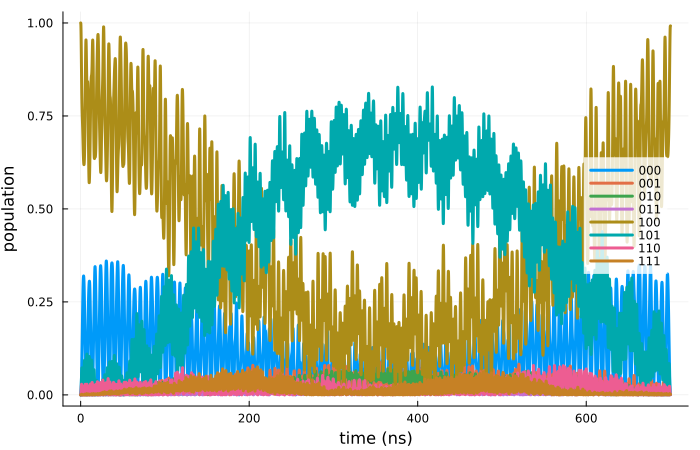

In [ ]:
plot_population1(obs000, obs001, obs010, obs011, obs100, obs101, obs110, obs111,tlist)

In [ ]:
obs000 = Float64[]
obs001 = Float64[]
obs010 = Float64[]
obs011 = Float64[]
obs100 = Float64[]
obs101 = Float64[]
obs110 = Float64[]
obs111 = Float64[]

psi_tj=ket_101
for i in 1:7000
    opt1 = opt_result_LBFGSB.optimized_controls[1][i]
    opt2 = opt_result_LBFGSB.optimized_controls[2][i]
    opt3 = opt_result_LBFGSB.optimized_controls[3][i]
    opt4 = opt_result_LBFGSB.optimized_controls[4][i]
    opt5 = opt_result_LBFGSB.optimized_controls[5][i]
    opt6 = opt_result_LBFGSB.optimized_controls[6][i]
    H_t = -0.5 * (Ω1 * σ̂_z_I_I + Ω2 *I_σ̂_z_I + Ω3 * I_I_σ̂_z)  + J1 * (I_σ̂_z_σ̂_z) + J2 *(σ̂_z_I_σ̂_z) + J3 * ( σ̂_z_σ̂_z_I) + opt1 * I_I_σ̂_x + opt2 * I_σ̂_xI + opt3 * σ̂_xI_I + opt4 * I_I_σ̂_y + opt5 * I_σ̂_y_I + opt6 * σ̂_y_I_I
    U = exp(-1im * H_t * dt)
    psi_tj= U * psi_tj

    psi_t000= dot(bra_000 ,psi_tj)
    psi_t001= dot(bra_001 ,psi_tj)
    psi_t010= dot(bra_010 ,psi_tj)
    psi_t011= dot(bra_011 ,psi_tj)
    psi_t100= dot(bra_100 ,psi_tj)
    psi_t101= dot(bra_101 ,psi_tj)
    psi_t110= dot(bra_110 ,psi_tj)
    psi_t111= dot(bra_111 ,psi_tj)
    psi2_t000j= abs.(psi_t000[1]).^2
    psi2_t001j= abs.(psi_t001[1]).^2
    psi2_t010j= abs.(psi_t010[1]).^2
    psi2_t011j= abs.(psi_t011[1]).^2
    psi2_t100j= abs.(psi_t100[1]).^2
    psi2_t101j= abs.(psi_t101[1]).^2
    psi2_t110j= abs.(psi_t110[1]).^2
    psi2_t111j= abs.(psi_t111[1]).^2

    append!(obs000,psi2_t000j)
    append!(obs001,psi2_t001j)
    append!(obs010,psi2_t010j)
    append!(obs011,psi2_t011j)
    append!(obs100,psi2_t100j)
    append!(obs101,psi2_t101j)
    append!(obs110,psi2_t110j)
    append!(obs111,psi2_t111j)
end

println(obs000)
println(obs001)
println(obs010)
println(obs011)
println(obs100)
println(obs101)
println(obs110)
println(obs111)

[6.868117162049593e-12, 1.4040449151138406e-10, 1.5992233647878595e-7, 4.5239746396441535e-6, 2.942420954479087e-5, 0.0001034932368894667, 0.0002647646380446172, 0.0005561347658564369, 0.0010201045858507778, 0.001693355080672546, 0.0026016197207555302, 0.003755155961083529, 0.00514502342760175, 0.006740403129255235, 0.008487322000650162, 0.010309292868227918, 0.012110418528068427, 0.013781335932578367, 0.015207959859733675, 0.01628239152851228, 0.016914741720208952, 0.01704417612526538, 0.016647390889187687, 0.015743044297686734, 0.014391354211570118, 0.012688949412323762, 0.010759898823255946, 0.008744409573857501, 0.006786845843405018, 0.005024474475088293, 0.003577824800520986, 0.0025429771577901153, 0.001985685793123867, 0.0019371316898383235, 0.0023912874004158036, 0.0033042220828961534, 0.004595964548366137, 0.006155570133509569, 0.007849698397587292, 0.009534349140789588, 0.011068613388942319, 0.012328639708069406, 0.013219737115220315, 0.013684759627640191, 0.013707603129696218

Excessive output truncated after 524300 bytes.

 0.0006532470917382845, 0.0005303600338970731, 0.0006385940476556118, 0.0008827416365706469, 0.0011560178921731117, 0.0013665681486520356, 0.0014572866471457536, 0.0014153063146092573, 0.0012709985735634031, 0.0010892034507557812, 0.0009568112563246312, 0.0009704686128128194, 0.0012264860817841512, 0.0018128688864187737, 0.002801786865407193, 0.004240480194161851, 0.006139735552377929, 0.008461202424280938, 0.011107031904145965, 0.013916584962633483, 0.016674537710511063, 0.019132456634813094, 0.021042348251905225, 0.022196849719454077, 0.022467855354682424, 0.021834491969570817, 0.020392931636770167, 0.01834430516525605, 0.015962021334654866, 0.013544764930534253, 0.01136498392794639, 0.009623809958513538, 0.008421781162130795, 0.007750895817304624, 0.007508468216995427, 0.0075283252520009485, 0.007621316188925102, 0.007615714359890841, 0.007389040109971285, 0.006885669351149659, 0.00611840365045392, 0.005155910164060299, 0.00410070286623493, 0.0030636329887980995, 0.00214065630394028

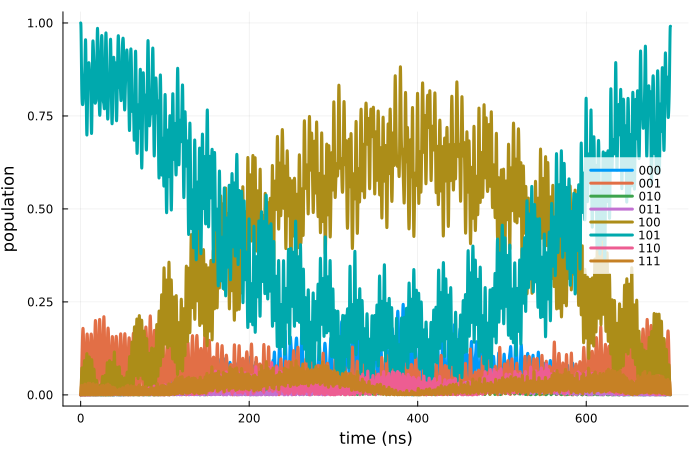

In [ ]:
plot_population1(obs000, obs001, obs010, obs011, obs100, obs101, obs110, obs111,tlist)

In [ ]:
obs000 = Float64[]
obs001 = Float64[]
obs010 = Float64[]
obs011 = Float64[]
obs100 = Float64[]
obs101 = Float64[]
obs110 = Float64[]
obs111 = Float64[]

psi_tj=ket_110
for i in 1:7000
    opt1 = opt_result_LBFGSB.optimized_controls[1][i]
    opt2 = opt_result_LBFGSB.optimized_controls[2][i]
    opt3 = opt_result_LBFGSB.optimized_controls[3][i]
    opt4 = opt_result_LBFGSB.optimized_controls[4][i]
    opt5 = opt_result_LBFGSB.optimized_controls[5][i]
    opt6 = opt_result_LBFGSB.optimized_controls[6][i]
    H_t = -0.5 * (Ω1 * σ̂_z_I_I + Ω2 *I_σ̂_z_I + Ω3 * I_I_σ̂_z)  + J1 * (I_σ̂_z_σ̂_z) + J2 *(σ̂_z_I_σ̂_z) + J3 * ( σ̂_z_σ̂_z_I) + opt1 * I_I_σ̂_x + opt2 * I_σ̂_xI + opt3 * σ̂_xI_I + opt4 * I_I_σ̂_y + opt5 * I_σ̂_y_I + opt6 * σ̂_y_I_I
    U = exp(-1im * H_t * dt)
    psi_tj= U * psi_tj

    psi_t000= dot(bra_000 ,psi_tj)
    psi_t001= dot(bra_001 ,psi_tj)
    psi_t010= dot(bra_010 ,psi_tj)
    psi_t011= dot(bra_011 ,psi_tj)
    psi_t100= dot(bra_100 ,psi_tj)
    psi_t101= dot(bra_101 ,psi_tj)
    psi_t110= dot(bra_110 ,psi_tj)
    psi_t111= dot(bra_111 ,psi_tj)
    psi2_t000j= abs.(psi_t000[1]).^2
    psi2_t001j= abs.(psi_t001[1]).^2
    psi2_t010j= abs.(psi_t010[1]).^2
    psi2_t011j= abs.(psi_t011[1]).^2
    psi2_t100j= abs.(psi_t100[1]).^2
    psi2_t101j= abs.(psi_t101[1]).^2
    psi2_t110j= abs.(psi_t110[1]).^2
    psi2_t111j= abs.(psi_t111[1]).^2

    append!(obs000,psi2_t000j)
    append!(obs001,psi2_t001j)
    append!(obs010,psi2_t010j)
    append!(obs011,psi2_t011j)
    append!(obs100,psi2_t100j)
    append!(obs101,psi2_t101j)
    append!(obs110,psi2_t110j)
    append!(obs111,psi2_t111j)
end

println(obs000)
println(obs001)
println(obs010)
println(obs011)
println(obs100)
println(obs101)
println(obs110)
println(obs111)

[3.1565670920718746e-13, 8.297265186754549e-11, 1.4550373487963897e-7, 4.087765157390859e-6, 2.5790071104574938e-5, 8.704238840695642e-5, 0.0002115426512358785, 0.0004178038790992856, 0.0007127672877268092, 0.0010875163695523143, 0.001516046228169793, 0.0019573898238657863, 0.0023607483703936773, 0.002672764492380235, 0.0028457956210335973, 0.0028459928828898627, 0.002660105254527387, 0.0023001232990391973, 0.0018050839600292164, 0.0012395592995098684, 0.0006885812682648898, 0.0002490716877812506, 1.8295347319563863e-5, 8.042001394003011e-5, 0.0004928561495768341, 0.0012744992878445229, 0.002398124901391874, 0.003788848286841985, 0.0053297269478537815, 0.006874360296745598, 0.008264975989843298, 0.009353306010086132, 0.010020857846039502, 0.010195178144361312, 0.009859414968595957, 0.00905374848557437, 0.007868772661804892, 0.006432312294961965, 0.004892141411440043, 0.0033974583750971806, 0.0020817720411461715, 0.0010492175303606474, 0.00036548967422844714, 5.379170927756647e-5, 9.560

Excessive output truncated after 524305 bytes.

, 0.007190276557173831, 0.0075485339479841014, 0.008715824261714317, 0.01077790746673648, 0.013827462637776925, 0.01795620720859587, 0.023245009592043637, 0.02974794433775767, 0.03746791382185516, 0.046325644745975246, 0.056128904203626144, 0.06655241135307434, 0.07713920581349291, 0.08733037523819782, 0.09652280371129442, 0.10414613410074385, 0.10974328181432681, 0.11303611538843415, 0.1139605875196204, 0.1126631204694685, 0.10946019033003544, 0.10477261406585103, 0.09905195757209373, 0.09271691753568778, 0.08611254568336063, 0.07949671345486403, 0.0730493399820344, 0.06689370511207365, 0.06111757990363216, 0.05578504870438763, 0.05093611183689389, 0.04657773794440671, 0.04267432254278574, 0.039145923857042526, 0.03587924102965318, 0.032750653171002314, 0.029655167283390432, 0.026532099775901385, 0.02337897606638545, 0.020249214088080957, 0.017235028572498493, 0.01444230928555388, 0.011966861852467052, 0.009880292135029795, 0.008229397846505004, 0.007046979993115931, 0.006366932529945

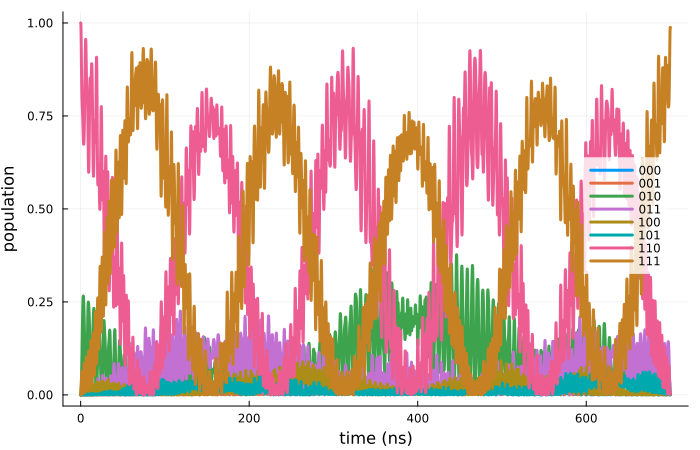

In [ ]:
plot_population1(obs000, obs001, obs010, obs011, obs100, obs101, obs110, obs111,tlist)

In [ ]:
obs000 = Float64[]
obs001 = Float64[]
obs010 = Float64[]
obs011 = Float64[]
obs100 = Float64[]
obs101 = Float64[]
obs110 = Float64[]
obs111 = Float64[]

psi_tj=ket_111
for i in 1:7000
    opt1 = opt_result_LBFGSB.optimized_controls[1][i]
    opt2 = opt_result_LBFGSB.optimized_controls[2][i]
    opt3 = opt_result_LBFGSB.optimized_controls[3][i]
    opt4 = opt_result_LBFGSB.optimized_controls[4][i]
    opt5 = opt_result_LBFGSB.optimized_controls[5][i]
    opt6 = opt_result_LBFGSB.optimized_controls[6][i]
    H_t = -0.5 * (Ω1 * σ̂_z_I_I + Ω2 *I_σ̂_z_I + Ω3 * I_I_σ̂_z)  + J1 * (I_σ̂_z_σ̂_z) + J2 *(σ̂_z_I_σ̂_z) + J3 * ( σ̂_z_σ̂_z_I) + opt1 * I_I_σ̂_x + opt2 * I_σ̂_xI + opt3 * σ̂_xI_I + opt4 * I_I_σ̂_y + opt5 * I_σ̂_y_I + opt6 * σ̂_y_I_I
    U = exp(-1im * H_t * dt)
    psi_tj= U * psi_tj

    psi_t000= dot(bra_000 ,psi_tj)
    psi_t001= dot(bra_001 ,psi_tj)
    psi_t010= dot(bra_010 ,psi_tj)
    psi_t011= dot(bra_011 ,psi_tj)
    psi_t100= dot(bra_100 ,psi_tj)
    psi_t101= dot(bra_101 ,psi_tj)
    psi_t110= dot(bra_110 ,psi_tj)
    psi_t111= dot(bra_111 ,psi_tj)
    psi2_t000j= abs.(psi_t000[1]).^2
    psi2_t001j= abs.(psi_t001[1]).^2
    psi2_t010j= abs.(psi_t010[1]).^2
    psi2_t011j= abs.(psi_t011[1]).^2
    psi2_t100j= abs.(psi_t100[1]).^2
    psi2_t101j= abs.(psi_t101[1]).^2
    psi2_t110j= abs.(psi_t110[1]).^2
    psi2_t111j= abs.(psi_t111[1]).^2

    append!(obs000,psi2_t000j)
    append!(obs001,psi2_t001j)
    append!(obs010,psi2_t010j)
    append!(obs011,psi2_t011j)
    append!(obs100,psi2_t100j)
    append!(obs101,psi2_t101j)
    append!(obs110,psi2_t110j)
    append!(obs111,psi2_t111j)
end

println(obs000)
println(obs001)
println(obs010)
println(obs011)
println(obs100)
println(obs101)
println(obs110)
println(obs111)

[1.362958621930756e-18, 2.1797470389147788e-15, 6.863207567032977e-11, 9.635323506665981e-9, 1.5250356407139803e-7, 9.574629989761345e-7, 3.6946477477970028e-6, 1.0478646120518832e-5, 2.3906782794796863e-5, 4.6189920762483925e-5, 7.799172301016754e-5, 0.00011740716851985917, 0.00015957338865296754, 0.0001972602559226198, 0.00022246338795779325, 0.00022862823436405942, 0.00021282381689583616, 0.0001770952596207593, 0.0001284180189091088, 7.710994886529449e-5, 3.408844351008401e-5, 7.797505165689102e-6, 1.8031678193474931e-6, 1.3882379864708182e-5, 3.695197595687923e-5, 6.155864446698773e-5, 7.909888218192006e-5, 8.466432694538822e-5, 7.852296670849917e-5, 6.572110165325377e-5, 5.396061391748041e-5, 5.052939484412873e-5, 5.94090366660257e-5, 7.96210513504352e-5, 0.0001054198187160792, 0.00012826272149193995, 0.00013983688734805116, 0.00013503999286488936, 0.00011384045381171264, 8.136522680674662e-5, 4.621735055066728e-5, 1.766152800326677e-5, 2.6981399970492886e-6, 4.040801942402073e-6,

Excessive output truncated after 524295 bytes.

 0.02860888923377377, 0.02852295046330702, 0.027199237912887312, 0.02470066399707667, 0.02126194405309837, 0.01725699034950777, 0.013133642903644735, 0.009331951984349104, 0.006206888658001225, 0.003974313137621539, 0.0026912116715973973, 0.002270565411961633, 0.002521542318476381, 0.003200237140632549, 0.004056419704873494, 0.004866974375201885, 0.005454375075665251, 0.005695310128051154, 0.005527656675091765, 0.0049622380552059924, 0.004100087097947616, 0.003148913860479789, 0.002427459545363877, 0.002346092782125793, 0.003357283203585854, 0.005879121120468801, 0.010205601455920988, 0.016424965434437912, 0.02436876455600949, 0.0336083125244344, 0.043503295537874756, 0.05329321221379955, 0.0622106337000124, 0.06958988632257798, 0.07494737029869664, 0.07801926836982655, 0.07875544842038489, 0.07728044179808967, 0.07383957605102935, 0.06874868984226001, 0.06235993250395071, 0.05504671261828448, 0.04720172803794665, 0.03923660464207523, 0.031571783874513704, 0.024610521485190794, 0.01869

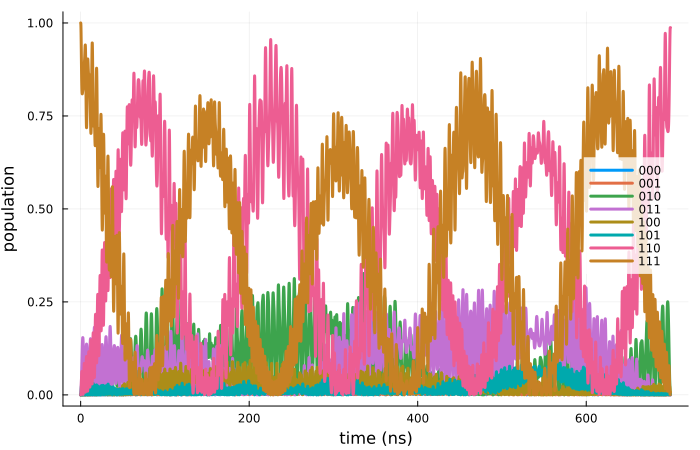

In [ ]:
plot_population1(obs000, obs001, obs010, obs011, obs100, obs101, obs110, obs111,tlist)